
# Data Mining for Big Data: *Project*

In [2]:
COLAB = False
PARRALLEL_COMPUTING = True
RANDOM_SEED = 42

if COLAB:
  from google.colab import drive
  drive.mount('/content/drive')
  ROOT_DIR = '/content/drive/MyDrive/data/DMBD'

  from google.colab import data_table
  data_table.enable_dataframe_formatter()

else:
  ROOT_DIR = './'

In [ ]:
# %ls

'data (1).zip'


In [ ]:
# !unzip zipdata

In [ ]:
# %ls

networks/  timeseries/  zipdata.zip


In [ ]:
# %cd ../projet/Data-Mining-for-Big-Data-Project.ipynb

[Errno 20] Not a directory: '../projet/Data-Mining-for-Big-Data-Project.ipynb'
/content/drive/MyDrive/bigdata/data


## Import :

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import TimeSeriesSplit, train_test_split, GridSearchCV
import os
from tqdm import tqdm

C:\Users\thoma\AppData\Local\Temp\ipykernel_12192\4239132434.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


## 1 csv

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/bigdata/data/networks/2017-6-30.csv', delimiter=';', encoding='utf-8', skipinitialspace=True)

In [ ]:
df.head()

,"Source,Target,value,nb_transactions"
0,"0,2566,184699,1"
1,"219,117,389226721537,5"
2,"Poloniex.com,129,612958037288,22"
3,"129,62,20104141,3"
4,"94,170,59146305,1"


## whole collection

### networks loading

In [ ]:
directory = '/content/drive/MyDrive/bigdata/data/networks/'
files = os.listdir(directory)
csv_files = [f for f in files if f.endswith('.csv')]

In [ ]:
df = [pd.read_csv(os.path.join(directory, file)) for file in tqdm(csv_files, 'merging dataframe')]
df_networks = pd.concat(df, ignore_index=True)

merging dataframe: 100%|██████████| 912/912 [00:10<00:00, 91.16it/s] 


In [ ]:
df_networks.head()

,Source,Target,value,nb_transactions
0,ePay.info_CoinJoinMess,SafeDice.com,126893596,1
1,0,20,253058692,21
2,Xapo.com,36222,674615000,5
3,14,1903,377041538,4
4,PocketDice.io,Cubits.com,2471594,1


### Timeseries loading

#### TASK 1

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


##### 2015 DATA

**Function to Process 2015 Data:**

preprocess_2015_data(df): Converts year, month, and day columns to week and weekday to align with the Task1 data format.

In [ ]:
# Function to convert 2015 data date columns into 'week' and 'weekday'
def preprocess_2015_data(df):
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']])
    df['week'] = df['date'].dt.isocalendar().week
    df['weekday'] = df['date'].dt.weekday
    return df.drop(['year', 'month', 'day', 'date'], axis=1)

**Load and Preprocess 2015 Data:**

Reads CSV files for 2015 and applies the preprocessing function to align the data format with Task1.

In [ ]:
# Load and preprocess 2015 data
external_2015 = preprocess_2015_data(pd.read_csv('/content/drive/MyDrive/bigdata/data/timeseries/2015/external.csv'))
global_2015 = preprocess_2015_data(pd.read_csv('/content/drive/MyDrive/bigdata/data/timeseries/2015/global.csv'))
by_actor_2015 = preprocess_2015_data(pd.read_csv('/content/drive/MyDrive/bigdata/data/timeseries/2015/by_actor.csv'))

**Merge 2015 Datasets:**

Combines the external, global, and by_actor datasets for 2015 based on week and weekday

In [ ]:
# Merge 2015 datasets
data_2015 = external_2015.merge(global_2015, on=['week', 'weekday'])
data_2015 = data_2015.merge(by_actor_2015, on=['week', 'weekday'])

In [ ]:
data_2015.head(1000)

,week,weekday,PriceUSD,HashRate,total_fee,total_received_satoshi,total_sent_satoshi,mean_fee_satoshi,mean_feeUSD,mean_fee_for100_x,...,received,nb_received,sum_fee,mean_fee_for100_y,nb_transactions_y,sent,self_spent,self_spent_estimated,nb_spent,spent
0,1,4,315.942732,333345.017260,1159934218,73370568521080,72955568521080,14978.682808,4.732406e+06,0.778933,...,34012156723,8395,15588104,1.882565,962,34009374770,0,0,2068,34009374770
1,1,4,315.942732,333345.017260,1159934218,73370568521080,72955568521080,14978.682808,4.732406e+06,0.778933,...,50000000,1,42966,0.200418,3,21707034,0,0,6,21707034
2,1,4,315.942732,333345.017260,1159934218,73370568521080,72955568521080,14978.682808,4.732406e+06,0.778933,...,54120689613,230,880706,1.752309,86,22815001320,0,0,179,22815001320
3,1,4,315.942732,333345.017260,1159934218,73370568521080,72955568521080,14978.682808,4.732406e+06,0.778933,...,1561500012,79,120000,0.052651,10,1002920134,0,0,20,1002920134
4,1,4,315.942732,333345.017260,1159934218,73370568521080,72955568521080,14978.682808,4.732406e+06,0.778933,...,31639115343,66,280000,0.016400,31,29063152655,0,0,59,29063152655
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,0,268.617232,291349.141442,3251351587,101188134963199,100828134963199,33531.533219,9.007147e+06,0.790210,...,1704578304,6,61995,0.009990,5,1584987401,0,0,10,1584987401
996,3,0,268.617232,291349.141442,3251351587,101188134963199,100828134963199,33531.533219,9.007147e+06,0.790210,...,180315657,213,830000,1.585200,64,389245709,40039449,40039449,126,349206260
997,3,0,268.617232,291349.141442,3251351587,101188134963199,100828134963199,33531.533219,9.007147e+06,0.790210,...,899046959628,1081,1380000,0.004623,219,933256402014,147056676670,543296643840,407,389959758174
998,3,0,268.617232,291349.141442,3251351587,101188134963199,100828134963199,33531.533219,9.007147e+06,0.790210,...,13717147922,136,390000,0.146966,27,10640952507,1690189796,1690189796,56,8950762711


##### TASK 1 DATA

**Load Task1 Data:**

Reads CSV files for Task1.

In [ ]:
# Load Task1 data
external_task1 = pd.read_csv('/content/drive/MyDrive/bigdata/data/timeseries/task1/external.csv')
global_task1 = pd.read_csv('/content/drive/MyDrive/bigdata/data/timeseries/task1/global.csv')
by_actor_task1 = pd.read_csv('/content/drive/MyDrive/bigdata/data/timeseries/task1/by_actor.csv')

**Merge Task1 Datasets:**

Combines the external, global, and by_actor datasets for Task1 based on week and weekday

In [ ]:
# Merge Task1 datasets
data_task1 = external_task1.merge(global_task1, on=['week', 'weekday'])
data_task1 = data_task1.merge(by_actor_task1, on=['week', 'weekday'])

In [ ]:
data_task1.head(1000)

,week,weekday,PriceUSD,HashRate,total_fee,total_received_satoshi,total_sent_satoshi,mean_fee_satoshi,mean_feeUSD,mean_fee_for100_x,...,received,nb_received,sum_fee,mean_fee_for100_y,nb_transactions_y,sent,self_spent,self_spent_estimated,nb_spent,spent
0,1,0,407.990154,1.257201e+06,5190513996,746007804579726,745627804579726,24772.648721,1.010700e+07,0.819482,...,190645831952,24628,79556787,3.397461,5566,193169945574,0,61700000000,9429,131469945574
1,1,0,407.990154,1.257201e+06,5190513996,746007804579726,745627804579726,24772.648721,1.010700e+07,0.819482,...,1544766934,82,2540233,2.849193,24,598111808,0,0,47,598111808
2,1,0,407.990154,1.257201e+06,5190513996,746007804579726,745627804579726,24772.648721,1.010700e+07,0.819482,...,7649524350,930,4800000,0.916793,384,12583121755,0,0,787,12583121755
3,1,0,407.990154,1.257201e+06,5190513996,746007804579726,745627804579726,24772.648721,1.010700e+07,0.819482,...,56207077970,4108,11013540,0.114409,412,39283429226,0,0,720,39283429226
4,1,0,407.990154,1.257201e+06,5190513996,746007804579726,745627804579726,24772.648721,1.010700e+07,0.819482,...,861853893,101,885180,0.470083,44,818057874,0,0,88,818057874
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,2,3,1023.317481,2.623277e+06,15310784046,167193857311125,167037607311125,66642.802624,6.819675e+07,1.776471,...,3237305189,32,643691,2.452886,6,3845048826,212753410,212753410,12,3632295416
996,2,3,1023.317481,2.623277e+06,15310784046,167193857311125,167037607311125,66642.802624,6.819675e+07,1.776471,...,108027850,12,145860,2.221772,3,73725671,3245371,3245371,6,70480300
997,2,3,1023.317481,2.623277e+06,15310784046,167193857311125,167037607311125,66642.802624,6.819675e+07,1.776471,...,234435366249,20781,190910000,1.761910,2009,294847079691,59060769209,169978244937,6006,124868834754
998,2,3,1023.317481,2.623277e+06,15310784046,167193857311125,167037607311125,66642.802624,6.819675e+07,1.776471,...,44575435490,1779,25121200,0.969118,515,26457115830,833333399,833333399,999,25623782431


##### Train dataset

**Create Lagged Features for 2015/Task1 Data:**

Generates lagged features (past values) for the PriceUSD column, which are essential for time series prediction.

In [ ]:
# Create lagged features for 2015 data
for lag in range(1, 6):
    data_2015[f'PriceUSD_lag{lag}'] = data_2015.groupby('week')['PriceUSD'].shift(lag)
    data_task1[f'PriceUSD_lag{lag}'] = data_task1.groupby('week')['PriceUSD'].shift(lag)


In [ ]:
# Include rolling statistics
window_size = 6  # one week
data_2015['rolling_mean'] = data_2015['PriceUSD'].rolling(window=window_size).mean()
data_2015['rolling_std'] = data_2015['PriceUSD'].rolling(window=window_size).std()
data_task1['rolling_mean'] = data_task1['PriceUSD'].rolling(window=window_size).mean()
data_task1['rolling_std'] = data_task1['PriceUSD'].rolling(window=window_size).std()

**Prepare 2015/Task1 Data for Modeling:**

Splits the 2015/Task1 data into features (X_train) and the target variable (y_train).

In [ ]:
# # Drop rows with missing values
# data_2015.dropna(inplace=True)
# data_task1.dropna(inplace=True)

# # Split 2015 data into features and target
# X_train = data_2015.drop(['PriceUSD'], axis=1)
# y_train = data_2015['PriceUSD']

# # Task 1 Split
# X_test = data_task1.drop(['PriceUSD'], axis=1)

# # Drop non-numeric columns (like 'xxxx') from training data
# X_train = X_train.select_dtypes(include=[np.number])
# X_test = X_test.select_dtypes(include=[np.number])

In [ ]:
# Drop rows with missing values after adding new features
data_2015.dropna(inplace=True)
data_task1.dropna(inplace=True)
# Ensure that only numeric columns are left
X_train = data_2015.select_dtypes(include=[np.number]).drop(['PriceUSD'], axis=1)
X_test = data_task1.select_dtypes(include=[np.number]).drop(['PriceUSD'], axis=1)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [ ]:
X_train.head()

,week,weekday,HashRate,total_fee,total_received_satoshi,total_sent_satoshi,mean_fee_satoshi,mean_feeUSD,mean_fee_for100_x,nb_transactions_x,...,self_spent_estimated,nb_spent,spent,PriceUSD_lag1,PriceUSD_lag2,PriceUSD_lag3,PriceUSD_lag4,PriceUSD_lag5,rolling_mean,rolling_std
5,1,4,333345.01726,1159934218,73370568521080,72955568521080,14978.682808,4.732406e+06,0.778933,77439,...,0,2,11567977,315.942732,315.942732,315.942732,315.942732,315.942732,315.942732,0.0
6,1,4,333345.01726,1159934218,73370568521080,72955568521080,14978.682808,4.732406e+06,0.778933,77439,...,0,6,29528276,315.942732,315.942732,315.942732,315.942732,315.942732,315.942732,0.0
7,1,4,333345.01726,1159934218,73370568521080,72955568521080,14978.682808,4.732406e+06,0.778933,77439,...,0,6,436170085,315.942732,315.942732,315.942732,315.942732,315.942732,315.942732,0.0
8,1,4,333345.01726,1159934218,73370568521080,72955568521080,14978.682808,4.732406e+06,0.778933,77439,...,0,6,10327572,315.942732,315.942732,315.942732,315.942732,315.942732,315.942732,0.0
9,1,4,333345.01726,1159934218,73370568521080,72955568521080,14978.682808,4.732406e+06,0.778933,77439,...,0,116,928580426,315.942732,315.942732,315.942732,315.942732,315.942732,315.942732,0.0


**Train the Model:**

Trains a RandomForestRegressor model using the 2015 data.
Make Predictions on Task1 Data:

In [ ]:
# # Train the model
# model = RandomForestRegressor(n_estimators=100, verbose=2)
# model.fit(X_train, y_train)

In [ ]:
# Model with hyperparameter tuning
model = RandomForestRegressor()
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5]
}
tscv = TimeSeriesSplit(n_splits=5)
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=tscv, verbose=2, n_jobs=-1)
grid_search.fit(X_train_scaled, data_2015['PriceUSD'])

Fitting 5 folds for each of 12 candidates, totalling 60 fits


GridSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
             estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [10, 20, None],
                         'min_samples_split': [2, 5],
                         'n_estimators': [100, 200]},
             verbose=2)

**Computing Value:**

Uses the trained model to predict Bitcoin values on the Task1 data.
value_predictions is generated using the RandomForestRegressor to predict the Bitcoin price for day 6.

In [ ]:
# Make predictions on Task1 data
# value_predictions = model.predict(X_test)

# Use the best estimator to make predictions
best_model = grid_search.best_estimator_
value_predictions = best_model.predict(X_test_scaled)

**Variation Predictions:**

variation_predictions is derived by comparing each predicted value (value_predictions) with the corresponding last known price (PriceUSD on day 5). It results in 1 (price going up) or -1 (price going down).

In [ ]:
# Determine if the price is going up or down
# This assumes 'PriceUSD' on day 5 is available in test sample data (which is)
variation_predictions = [1 if value_predictions[i] > data_task1['PriceUSD'].iloc[i] else -1 for i in range(len(value_predictions))]

**Prepare and Save Submission File:**

Formats the predictions according to the requirements and saves them to a CSV file named value_pred.csv.

In [ ]:
# Prepare submission file
value_output_df  = pd.DataFrame({'week': data_task1['week'], 'weekday': 6, 'Predicted_PriceUSD': value_predictions})
value_output_df.to_csv('/content/drive/MyDrive/bigdata/data/timeseries/value_pred.csv', index=False)

In [ ]:
# Save Variation Predictions
variation_output_df = pd.DataFrame({'week': data_task1['week'], 'weekday': 6, 'variation': variation_predictions})
variation_output_df.to_csv('/content/drive/MyDrive/bigdata/data/timeseries/variation_pred.csv', index=False)

In [ ]:
# Create a DataFrame for the combined predictions
pred = pd.DataFrame({
    'week': data_task1['week'],
    'weekday': 6,
    'Predicted_PriceUSD': value_predictions,
    'variation': variation_predictions
})

# Save the combined predictions to pred.csv
pred.to_csv('/content/drive/MyDrive/bigdata/data/timeseries/pred.csv', index=False)


##### Plot

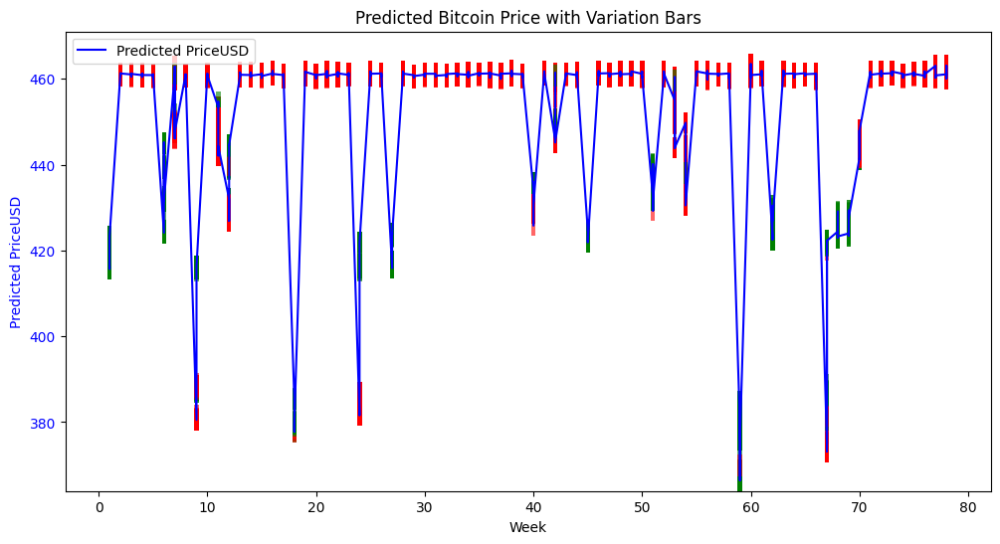

In [ ]:
fig, ax1 = plt.subplots(figsize=(12, 6))

# Line plot for Predicted_PriceUSD
ax1.plot(pred['week'], pred['Predicted_PriceUSD'], color='blue', label='Predicted PriceUSD')
ax1.set_xlabel('Week')
ax1.set_ylabel('Predicted PriceUSD', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Bars for variation placed at the Predicted_PriceUSD level
bar_height = 5 # Adjust the height
for i in range(len(pred)):
    color = 'green' if pred['variation'].iloc[i] > 0 else 'red'
    ax1.bar(pred['week'].iloc[i], bar_height, bottom=pred['Predicted_PriceUSD'].iloc[i] - (bar_height / 2),
            color=color, alpha=0.6, width=0.4)

# Title and legend
plt.title('Predicted Bitcoin Price with Variation Bars')
ax1.legend(loc='upper left')

plt.show()

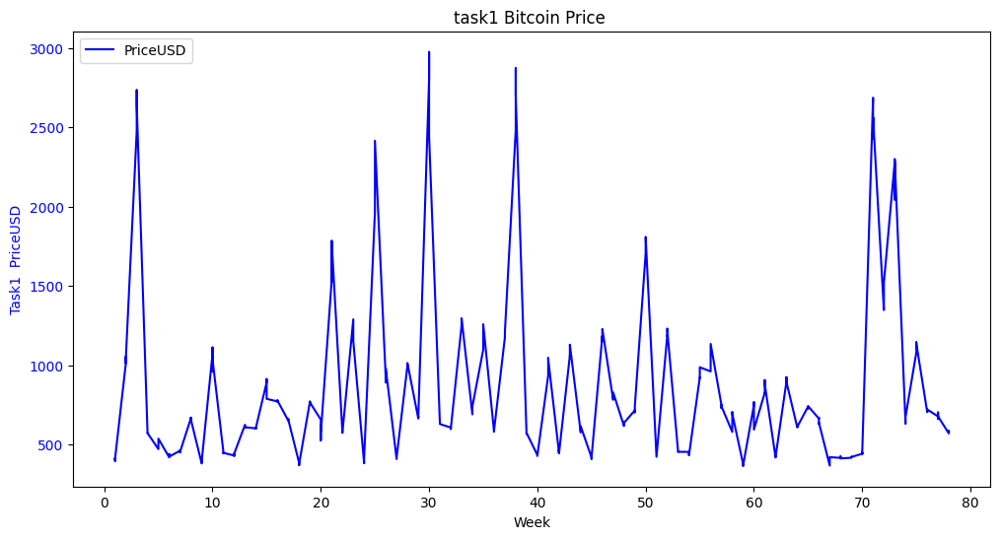

In [ ]:
fig, ax1 = plt.subplots(figsize=(12, 6))

# Line plot for Predicted_PriceUSD
ax1.plot(data_task1['week'], data_task1['PriceUSD'], color='blue', label='PriceUSD')
ax1.set_xlabel('Week')
ax1.set_ylabel('Task1  PriceUSD', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Title and legend
plt.title('task1 Bitcoin Price ')
ax1.legend(loc='upper left')

plt.show()

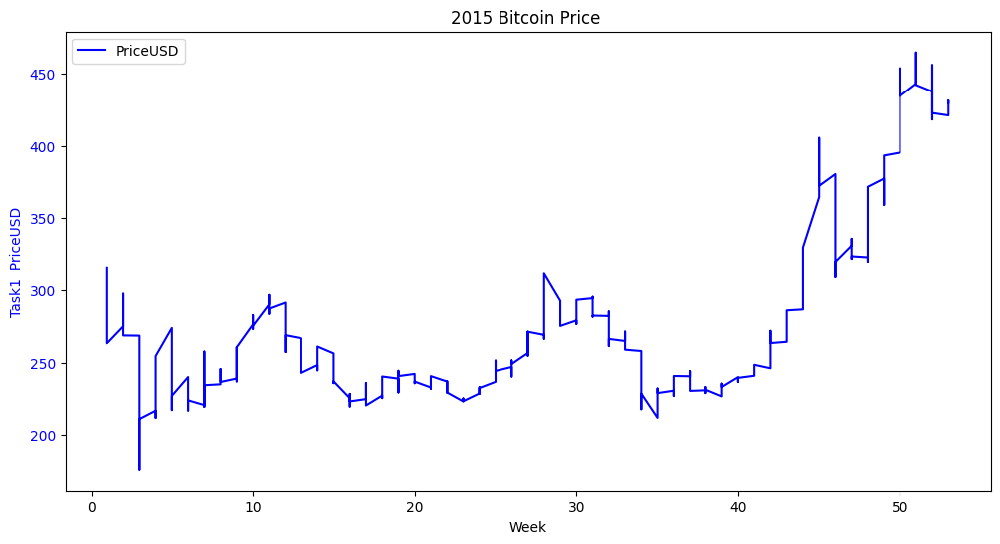

In [ ]:
fig, ax1 = plt.subplots(figsize=(12, 6))

# Line plot for Predicted_PriceUSD
ax1.plot(data_2015['week'], data_2015['PriceUSD'], color='blue', label='PriceUSD')
ax1.set_xlabel('Week')
ax1.set_ylabel('Task1  PriceUSD', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Title and legend
plt.title('2015 Bitcoin Price ')
ax1.legend(loc='upper left')

plt.show()

# TASK 2

In [3]:
from community import community_louvain
import matplotlib.pyplot as plt
import networkx as nx
import os
import pandas as pd
import pickle

C:\Users\thoma\AppData\Local\Temp\ipykernel_11084\2676122320.py:5: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [4]:
from concurrent.futures import ThreadPoolExecutor, ProcessPoolExecutor
from datetime import datetime
from tqdm import tqdm

First let's get the list of name (i.e the dates) of each files of the networks folder.

In [5]:
daily_bitcoin_files = [f for f in os.listdir(f'{ROOT_DIR}/networks')]
daily_bitcoin_files[:5]

['2015-1-1.csv',
 '2015-1-10.csv',
 '2015-1-11.csv',
 '2015-1-12.csv',
 '2015-1-13.csv']

We can now put the data into a pandas dataframe :

First we load each files into their own dataframe

In [6]:
def load_daily_bitcoin_transactions_file(filename):
  return pd.read_csv(f'{ROOT_DIR}/networks/{filename}'
  ).assign(
      Date=datetime.strptime(filename.split('.')[0], "%Y-%m-%d")
  )

In [7]:
if PARRALLEL_COMPUTING :
  with ThreadPoolExecutor() as executor:
    daily_bitcoin_transactions = list(
        tqdm(
            executor.map(load_daily_bitcoin_transactions_file, daily_bitcoin_files),
            total=len(daily_bitcoin_files),
            desc="Loading files in parrallel ..."
        )
    )
else:
  daily_bitcoin_transaction = [
      load_daily_bitcoin_transactions_file(file)
      for file in tqdm(daily_bicoin_files, "Loading files ...")
      ]

Loading files in parrallel ...:   4%|▍         | 40/912 [00:00<00:07, 119.75it/s]

Loading files in parrallel ...: 100%|██████████| 912/912 [00:08<00:00, 107.57it/s]


In [8]:
len(daily_bitcoin_transactions)

912

In [9]:
daily_bitcoin_transactions[0]

,Source,Target,value,nb_transactions,Date
0,ePay.info_CoinJoinMess,CloudBet.com,3519173,1,2015-01-01
1,Cex.io,1956,8491196,3,2015-01-01
2,157228,C-Cex.com,10833480021,1,2015-01-01
3,0,421,27123449,8,2015-01-01
4,BTCGuild.com,787953,2507884460,1,2015-01-01
...,...,...,...,...,...
2036,302372,Cryptsy.com,105631994,2,2015-01-01
2037,84134,425465,28718254,1,2015-01-01
2038,Paymium.com,CloudBet.com,9646147097,1,2015-01-01
2039,FaucetBOX.com,Matbea.com,7936869,1,2015-01-01


Now we can merge those dataframe in one, since thay have the same format, that contain all our data:

In [10]:
transaction_network_df = pd.concat(daily_bitcoin_transactions)

### stats

Let's check the datatype of each column dans the number of row.

In [11]:
transaction_network_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5876734 entries, 0 to 5654
Data columns (total 5 columns):
 #   Column           Dtype         
---  ------           -----         
 0   Source           object        
 1   Target           object        
 2   value            int64         
 3   nb_transactions  int64         
 4   Date             datetime64[us]
dtypes: datetime64[us](1), int64(2), object(2)
memory usage: 269.0+ MB


We get a look at the data :

In [12]:
transaction_network_df.head(10)

,Source,Target,value,nb_transactions,Date
0,ePay.info_CoinJoinMess,CloudBet.com,3519173,1,2015-01-01
1,Cex.io,1956,8491196,3,2015-01-01
2,157228,C-Cex.com,10833480021,1,2015-01-01
3,0,421,27123449,8,2015-01-01
4,BTCGuild.com,787953,2507884460,1,2015-01-01
5,SatoshiMines.com,421,36288199,1,2015-01-01
6,ePay.info_CoinJoinMess,C-Cex.com,4334845502,1,2015-01-01
7,Bitcoin.de,Cryptsy.com,101000012,1,2015-01-01
8,ePay.info_CoinJoinMess,72236394,4334845502,1,2015-01-01
9,16425460,72603512,13975700,1,2015-01-01


Then we display some statistics :

In [13]:
summary_df = transaction_network_df.describe(include='all', datetime_is_numeric=False)
summary_df

TypeError: NDFrame.describe() got an unexpected keyword argument 'datetime_is_numeric'

Let's look if we have missing values to fullfill :

In [ ]:
missing_values = transaction_network_df.isnull().sum()
missing_values

Source             0
Target             0
value              0
nb_transactions    0
Date               0
dtype: int64

In [ ]:
missing_values = transaction_network_df.isna().sum()
missing_values

Source             0
Target             0
value              0
nb_transactions    0
Date               0
dtype: int64

There is no missing values and the dattype are correct.  
Let's build out transaction graphs.

### Daily transaction graph

From the dataframe of a csv file correponding to one day, we build the corresponding  weighted directed multi-graph with networkx by specifying the source, target, weight and number of edge columns.

In [ ]:
def create_graph(graph_df):
  return (
      graph_df['Date'][0],
      nx.from_pandas_edgelist(
          graph_df, 'Source', 'Target',
          edge_attr=['value', 'nb_transactions'],
          create_using=nx.MultiDiGraph())
      )

In [ ]:
transaction_graphs = {}

In [ ]:
if PARRALLEL_COMPUTING:
  with ProcessPoolExecutor() as executor:
    result = list(tqdm(
        executor.map(create_graph, daily_bitcoin_transactions,),
        total=len(daily_bitcoin_transactions),
        desc="Computing daily transaction graphs in parrallel ..."
    ))

  transaction_graphs = {
      date : graph
      for date, graph in result
  }

else:
  for graph_df in tqdm(daily_bitcoin_transactions, "Computing daily transactions graphs ..."):
      graph = nx.from_pandas_edgelist(graph_df, 'Source', 'Target', edge_attr=['value', 'nb_transactions'], create_using=nx.MultiDiGraph())
      transaction_graphs[graph_df['Date'][0]] = graph

Computing daily transaction graphs in parrallel ...: 100%|██████████| 912/912 [01:59<00:00,  7.64it/s]


In [ ]:
len(transaction_graphs)

912

Let's get a look of the data to get an idea of the number of community we can find:

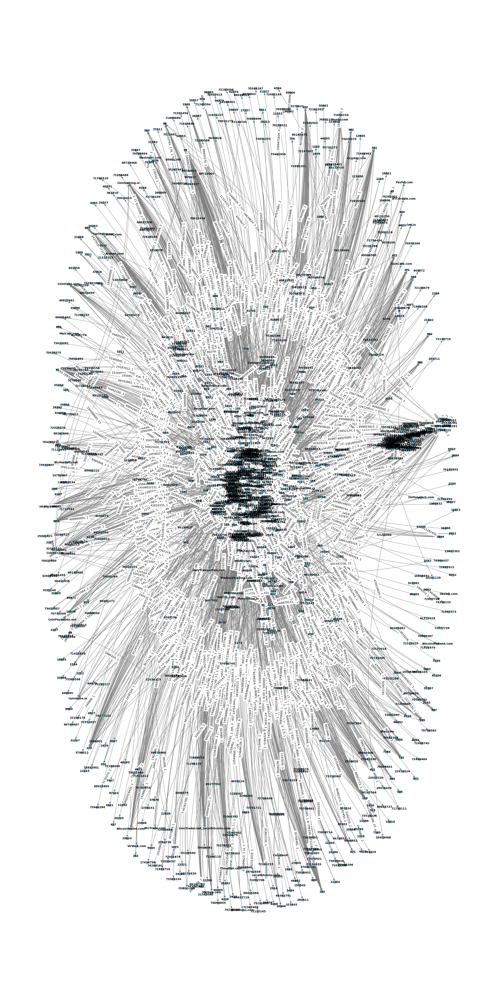

In [ ]:
for G_multi in  transaction_graphs.values():
  # Visualize the multigraph
  plt.figure(figsize=(25, 50))
  pos_multi = nx.spring_layout(G_multi)  # You can choose a layout that suits your data
  nx.draw(G_multi, pos_multi, with_labels=True, font_weight='bold', node_size=100, node_color='skyblue', font_size=10, edge_color='gray', width=1, arrowsize=15, connectionstyle='arc3,rad=0.1')
  edge_labels_multi = {(source, target): f"{data['value']}, {data['nb_transactions']}" for source, target, data in G_multi.edges(data=True)}
  nx.draw_networkx_edge_labels(G_multi, pos_multi, edge_labels=edge_labels_multi)

  plt.show()
  break

In order to analyse the community over time, let's compute the community for each graph :

In [ ]:
community_evolution = {}
community_save_path = f'{ROOT_DIR}/save/community_evolution_dict.pkl'

In [ ]:
def create_community(args):
  date, graph = args
  return (date, nx.algorithms.community.greedy_modularity_communities(graph))

In [ ]:
if PARRALLEL_COMPUTING:
  with ThreadPoolExecutor() as executor:
    result = list(tqdm(
        executor.map(create_community, transaction_graphs.items()),
        total=len(transaction_graphs),
        desc="Computing Communities in parrallel ..."
    ))

  community_evolution = {
      date : graph
      for date, graph in result
  }

else:
  for date, graph in tqdm(transaction_graphs.items(), "Computing communities ..."):
    community_evolution[date] = create_community(graph)[1]

with open(community_save_path, 'wb') as file:
    pickle.dump(community_evolution, file)

Computing Communities in parrallel ...: 100%|██████████| 912/912 [2:45:18<00:00, 10.88s/it]


In [ ]:
with open(community_save_path, 'rb') as file:
  community_evolution = pickle.load(file)

In [ ]:
for i, communities in enumerate(list(create_community(graph))):

    if i > 10: break

    # Create a color map for nodes based on community
    community_color_map = {}
    for idx, comm in enumerate(communities):
        for node in comm:
            community_color_map[node] = idx

    # Create a subgraph for each community
    subgraphs = [graph.subgraph(comm) for comm in communities]

    # Plot each subgraph with a different color
    plt.figure(figsize=(10, 8))
    pos = nx.spring_layout(graph)  # You can use other layout algorithms as well
    for i, subgraph in enumerate(subgraphs):
        nx.draw(subgraph, pos, node_color=[community_color_map[node] for node in subgraph.nodes()],
                with_labels=True, cmap=plt.cm.rainbow, vmin=0, vmax=len(communities)-1,
                node_size=50, font_size=8, font_color='black', font_weight='bold')
        plt.title(f"Community Detection on {date}")
        plt.show()

Here we define a classes to track the evolution of found communities over time:

In [ ]:
from enum import Enum

class EventTypeEnum(Enum):
  FORMING = 1
  DISOLVING = -1
  CONTINUING = 0
  SHRINKING = -2
  GROWING = 2
  SPLITTING = 3
  MERGING = -3

In [ ]:
class EventTime():

  def __init__(self, event_type, **kargs):
    self.event_type = event_type
    # switch the event type and store the metadata of event
    # i.e the communities id in case of merge/split
    # the proportion of members add or remove


In [ ]:
class TemporalCommunity():
    def __init__(self, members, date):
      self.members = members
      self.event_history = {
          date : EventTime(EventTypeEnum.FORMING)
      }

## Temporal network with Teneto  

[documentation](https://teneto.readthedocs.io/en/latest/tutorial/networkrepresentation.html)

In [ ]:
%pip install teneto

In [14]:
import teneto
from teneto import TemporalNetwork

d:\DSC\DMBD\projet\.venv\lib\site-packages\nilearn\input_data\__init__.py:23: FutureWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  warnings.warn(message, FutureWarning)


In [15]:
transaction_network_df.sort_values('Date', inplace=True)

We need to rename the columns name for teneto library

In [16]:
transaction_network_df = transaction_network_df.rename(columns={
    'Source': 'i',
    'Target': 'j',
    'value': 'weight',
    'Date': 't'
})

In [17]:
transaction_network_df['t'] = pd.to_datetime(transaction_network_df['t'])

In [18]:
transaction_network_df.head(1)

,i,j,weight,nb_transactions,t
0,ePay.info_CoinJoinMess,CloudBet.com,3519173,1,2015-01-01


We need to vectorize column i and j in order to create a temporal graph with teneto :

In [19]:
# get the data of columns i and j as str
nodes_values = []

for col_name in ['i', 'j']:
  nodes_values += transaction_network_df[col_name].astype(str).tolist()

In [20]:
len(nodes_values)

11753468

In [21]:
# delete duplicated entries
nodes_vectorizer = {}
nodes_reverse_vectorizer = {}
k=0

for i in nodes_values:
  if i not in nodes_vectorizer:
    nodes_vectorizer[i] = k
    nodes_reverse_vectorizer[k] = i
    k += 1

In [22]:
len(nodes_vectorizer)

9975

Then we can convert all entry of column i and j into integer thank to our vectorizer:

In [23]:
def vectorize_ij(entry):
  return nodes_vectorizer[entry]

In [24]:
for col_name in ['i', 'j']:
  transaction_network_df[col_name] = transaction_network_df[col_name].map(vectorize_ij)


We convert the dates into a timestamp

In [25]:
def datetime_to_timestamp(date):
  return date.astype(int).div(10**9)

def timestamp_to_datetime(timestamp):
  return pd.to_datetime(timestamp, unit='s')

In [26]:
transaction_network_df['t'] = (
    transaction_network_df['t'].dt.year * 1e4 +
    transaction_network_df['t'].dt.month * 1e2 +
    transaction_network_df['t'].dt.day
    ).astype(int)

In [31]:
transaction_network_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5876734 entries, 0 to 4750
Data columns (total 5 columns):
 #   Column           Dtype
---  ------           -----
 0   i                int64
 1   j                int64
 2   weight           int64
 3   nb_transactions  int64
 4   t                int32
dtypes: int32(1), int64(4)
memory usage: 246.6 MB


Then we create a temporal graph with teneto library:

In [28]:
tn = TemporalNetwork(
    from_df=transaction_network_df,
    nettype='wd', # weigthed & directed
    timetype='continuous',
    diagonal=True,
    timeunit="jours",
    desc="Temporal graph representation of bitcoin daily transaction from 01/01/2015 to 30/06/2017"
    )

d:\DSC\DMBD\projet\.venv\lib\site-packages\teneto\classes\network.py:242: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.network['i'] = self.network['i'].astype(int)
d:\DSC\DMBD\projet\.venv\lib\site-packages\teneto\classes\network.py:243: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.network['j'] = self.network['j'].astype(int)


MemoryError: Unable to allocate 14.9 TiB for an array with shape (9975, 9975, 20530) and data type float64

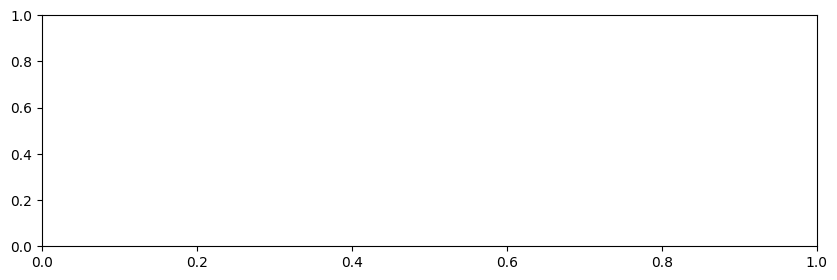

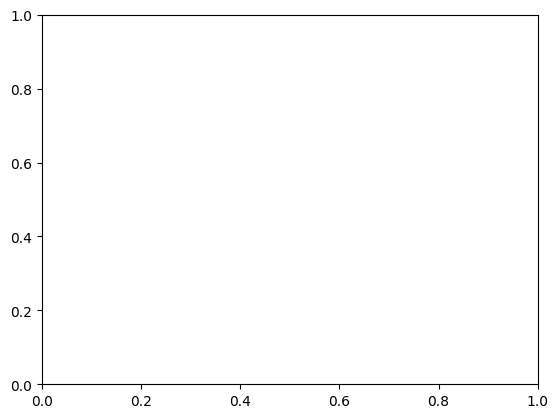

In [30]:
# Fait cracher colab pas assez de ram, tester en local.
# Set color map
plt.rcParams['image.cmap'] = 'autumn'

fig,ax = plt.subplots(figsize=(10,3))
tn.plot(plottype="slice_plot")
plt.tight_layout()
plt.show()

teneto.communitydeteection

In [26]:
network_measures = [
    'bursty_coeff', 'fluctuability', 'intercontacttimes',
    'local_variation', 'reachability_latency', 'shortest_temporal_path',
    'sid', ' temporal_betweenness_centrality', 'temporal_closeness_centrality',
    'temporal_degree_centrality', 'temporal_efficiency',
    'temporal_participation_coeff', 'topological_overlap', 'volatility']

In [27]:
res = tn.calc_networkmeasure(networkmeasure="fluctuability")

MemoryError: Unable to allocate 14.3 PiB for an array with shape (9975, 9975, 20170631) and data type float64

In [ ]:
res

In [33]:
res2 = teneto.communitydetection.temporal_louvain(tn, randomseed=RANDOM_SEED)

d:\DSC\DMBD\projet\.venv\lib\site-packages\teneto\utils\utils.py:1082: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tnet.network['i'] = tnet.network['i'].astype(int)
d:\DSC\DMBD\projet\.venv\lib\site-packages\teneto\utils\utils.py:1083: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tnet.network['j'] = tnet.network['j'].astype(int)
d:\DSC\DMBD\projet\.venv\lib\site-packages\teneto\utils\utils.py:1084: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

KeyboardInterrupt: 

In [ ]:
with open(f'{ROOT_DIR}/save/louvain_community.pkl') as f:
    pickle.dump(res2, f)

FileNotFoundError: [Errno 2] No such file or directory: './/save/louvain_community.pkl'